# 2. Edge detection

In [13]:
import cv2
import numpy as np
import os
import matplotlib
from matplotlib import pyplot as plt
import time
os.chdir("../images/")

## 2.1: Canny edge detection:

The process of Canny edge detection algorithm can be broken down to 5 different steps:

1. Apply Gaussian filter to smooth the image in order to remove the noise.
2. Find the intensity gradients of the image.
3. Apply non-maximum suppression to get rid of spurious response to edge detection.
4. Apply double threshold to determine potential edges.
5. Track edge by hysteresis: Finalize the detection of edges by suppressing all the other edges that are weak and not connected to strong edges.

## 2.2: Thresholds:

The threshold pairs that were tried are:
1. 70, 140
2. 75, 150
3. 80, 160
4. 90, 180
5. 100, 200

Text(0.5, 1.0, 'Edges, t1 = 100, t2 = 200')

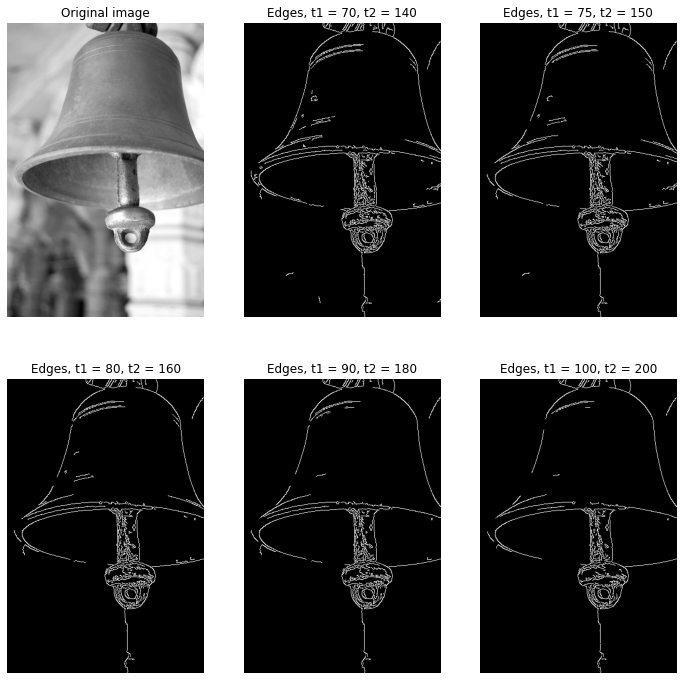

In [14]:
img = cv2.imread('input_data/bell.jpg')
# print(img)
img = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
edges1 = cv2.Canny(img,70,140)
cv2.imwrite('output_data/Q2/Q2_1/bell_edge_canny_070_140.jpg',edges1)
edges2 = cv2.Canny(img,75,150)
cv2.imwrite('output_data/Q2/Q2_2/bell_edge_canny_070_140.jpg',edges1)
cv2.imwrite('output_data/Q2/Q2_2/bell_edge_canny_075_150.jpg',edges2)
edges3 = cv2.Canny(img,80,160)
cv2.imwrite('output_data/Q2/Q2_2/bell_edge_canny_080_160.jpg',edges3)
edges4 = cv2.Canny(img,90,180)
cv2.imwrite('output_data/Q2/Q2_2/bell_edge_canny_090_180.jpg',edges4)
edges5 = cv2.Canny(img,100,200)
cv2.imwrite('output_data/Q2/Q2_2/bell_edge_canny_100_200.jpg',edges5)

fig=plt.figure(figsize=(12,12))

ax1=fig.add_subplot(2,3,1)
ax1.imshow(img,cmap="gray")
ax1.axis('off')
ax1.set_title("Original image")

ax2=fig.add_subplot(2,3,2)
ax2.imshow(edges1,cmap="gray")
ax2.axis('off')
ax2.set_title("Edges, t1 = 70, t2 = 140")

ax3=fig.add_subplot(2,3,3)
ax3.imshow(edges2,cmap="gray")
ax3.axis('off')
ax3.set_title("Edges, t1 = 75, t2 = 150")

ax4=fig.add_subplot(2,3,4)
ax4.imshow(edges3,cmap="gray")
ax4.axis('off')
ax4.set_title("Edges, t1 = 80, t2 = 160")

ax5=fig.add_subplot(2,3,5)
ax5.imshow(edges4,cmap="gray")
ax5.axis('off')
ax5.set_title("Edges, t1 = 90, t2 = 180")

ax6=fig.add_subplot(2,3,6)
ax6.imshow(edges5,cmap="gray")
ax6.axis('off')
ax6.set_title("Edges, t1 = 100, t2 = 200")

## 2.3: Basic Edge Filters

We'll be looking at 4 filters: Roberts, Prewitt, Sobel and Laplacian.

Roberts filter:

$F_x = \begin{bmatrix}0 & 1\\-1 & 0\end{bmatrix}$, $F_y = \begin{bmatrix}1 & 0\\0 & -1\end{bmatrix}$

Prewitt filter:

$F_x = \begin{bmatrix}-1 & 0 & 1\\-1 & 0 & 1\\-1 & 0 & 1\end{bmatrix}$, $F_y = \begin{bmatrix}-1 & -1 & -1\\0 & 0 & 0\\1 & 1 & 1\end{bmatrix}$

Sobel filter:

$F_x = \begin{bmatrix}-1 & 0 & 1\\-2 & 0 & 2\\-1 & 0 & 1\end{bmatrix}$, $F_y = \begin{bmatrix}-1 & -2 & -1\\0 & 0 & 0\\1 & 2 & 1\end{bmatrix}$

Laplacian filter:

$F_x = \begin{bmatrix}0 & 1 & 0\\1 & -4 & 1\\0 & 1 & 0\end{bmatrix}$, $F_y = \begin{bmatrix}1 & 1 & 1\\1 & -8 & 1\\1 & 1 & 1\end{bmatrix}$

In [45]:
# 3x3 and 2x2 filters.

roberts_x = np.array([[0,1],[-1,0]])
roberts_y = np.array([[1,0],[0,-1]])
print(roberts_x)
print(roberts_y)

prewitt_x = np.array([[-1,0,1],[-1,0,1],[-1,0,1]])
prewitt_y = -np.transpose(prewitt_x)
print(prewitt_x)
print(prewitt_y)

sobel_x = np.array([[-1,0,1],[-2,0,2],[-1,0,1]])
sobel_y = -np.transpose(sobel_x)
print(sobel_x)
print(sobel_y)

laplace1 = np.array([[1,1,1],[1,-8,1],[1,1,1]])
laplace2 = np.array([[0,1,0],[1,-4,1],[0,1,0]])
print(laplace1)
print(laplace2)

[[ 0  1]
 [-1  0]]
[[ 1  0]
 [ 0 -1]]
[[-1  0  1]
 [-1  0  1]
 [-1  0  1]]
[[ 1  1  1]
 [ 0  0  0]
 [-1 -1 -1]]
[[-1  0  1]
 [-2  0  2]
 [-1  0  1]]
[[ 1  2  1]
 [ 0  0  0]
 [-1 -2 -1]]
[[ 1  1  1]
 [ 1 -8  1]
 [ 1  1  1]]
[[ 0  1  0]
 [ 1 -4  1]
 [ 0  1  0]]


In [46]:
def filter_img(im, fil):
    fil = np.array(fil)     
    view_shape = tuple(np.subtract(im.shape, fil.shape) + 1) + fil.shape
    strd = np.lib.stride_tricks.as_strided 
    subM = strd(im, shape = view_shape, strides = im.strides * 2)   
    return np.einsum('ij,ijkl->kl',fil,subM.T).T

def filter_general(im,fil):
    f = np.array(fil)
    img = np.array(im)
    k = fil.shape[0]
    h,w = img.shape
    d = int(k-1)
    m = int(d/2)
    imn = np.zeros([h+d,w+d])
    imn[m:h+m,m:w+m] = img[:,:]
    img_new = np.zeros([h,w])
    img_new = filter_img(img,f)
    img_new = np.floor(img_new).astype('uint8')
    return img_new

Text(0.5, 1.0, 'Canny edge filter:T1=100,T2=200')

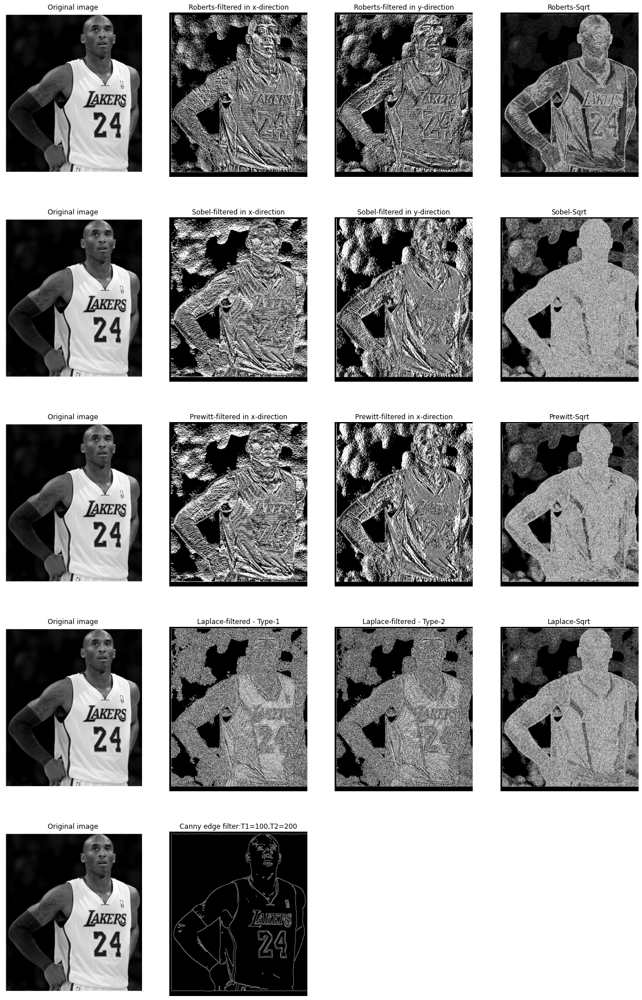

In [64]:
img = cv2.imread('input_data/kobe.png')
img = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

f1 = filter_general(img,roberts_x)
f2 = filter_general(img,roberts_y)
f12 = np.floor(np.sqrt(f1**2 + f2**2)).astype('uint8')
f3 = filter_general(img,sobel_x)
f4 = filter_general(img,sobel_y)
f34 = np.floor(np.sqrt(f3**2 + f4**2)).astype('uint8')
f5 = filter_general(img,prewitt_x)
f6 = filter_general(img,prewitt_y)
f56 = np.floor(np.sqrt(f5**2 + f6**2)).astype('uint8')
f7 = filter_general(img,laplace1)
f8 = filter_general(img,laplace2)
f78 = np.floor(np.sqrt(f7**2 + f8**2)).astype('uint8')
f9 = cv2.Canny(img,100,200)

cv2.imwrite('output_data/Q2/Q2_3/kobe_roberts_x.jpg',f1)
cv2.imwrite('output_data/Q2/Q2_3/kobe_roberts_y.jpg',f2)
cv2.imwrite('output_data/Q2/Q2_3/kobe_sqrt1.jpg',f12)
cv2.imwrite('output_data/Q2/Q2_3/kobe_sobel_x.jpg',f3)
cv2.imwrite('output_data/Q2/Q2_3/kobe_sobel_y.jpg',f4)
cv2.imwrite('output_data/Q2/Q2_3/kobe_sqrt2.jpg',f34)
cv2.imwrite('output_data/Q2/Q2_3/kobe_prewitt_x.jpg',f5)
cv2.imwrite('output_data/Q2/Q2_3/kobe_prewitt_y.jpg',f6)
cv2.imwrite('output_data/Q2/Q2_3/kobe_sqrt3.jpg',f56)
cv2.imwrite('output_data/Q2/Q2_3/kobe_laplace_1.jpg',f7)
cv2.imwrite('output_data/Q2/Q2_3/kobe_laplace_2.jpg',f8)
cv2.imwrite('output_data/Q2/Q2_3/kobe_sqrt4.jpg',f78)
cv2.imwrite('output_data/Q2/Q2_3/kobe_canny.jpg',f9)

fig = plt.figure(figsize=(20,32))

ax11 = fig.add_subplot(5,4,1)
ax11.imshow(img,cmap="gray")
ax11.axis('off')
ax11.set_title("Original image")

ax12 = fig.add_subplot(5,4,2)
ax12.imshow(f1,cmap="gray")
ax12.axis('off')
ax12.set_title("Roberts-filtered in x-direction")

ax13 = fig.add_subplot(5,4,3)
ax13.imshow(f2,cmap="gray")
ax13.axis('off')
ax13.set_title("Roberts-filtered in y-direction")

ax14 = fig.add_subplot(5,4,4)
ax14.imshow(f12,cmap="gray")
ax14.axis('off')
ax14.set_title("Roberts-Sqrt")

ax21 = fig.add_subplot(5,4,5)
ax21.imshow(img,cmap="gray")
ax21.axis('off')
ax21.set_title("Original image")

ax22 = fig.add_subplot(5,4,6)
ax22.imshow(f3,cmap="gray")
ax22.axis('off')
ax22.set_title("Sobel-filtered in x-direction")

ax23 = fig.add_subplot(5,4,7)
ax23.imshow(f4,cmap="gray")
ax23.axis('off')
ax23.set_title("Sobel-filtered in y-direction")

ax24 = fig.add_subplot(5,4,8)
ax24.imshow(f34,cmap="gray")
ax24.axis('off')
ax24.set_title("Sobel-Sqrt")

ax31 = fig.add_subplot(5,4,9)
ax31.imshow(img,cmap="gray")
ax31.axis('off')
ax31.set_title("Original image")

ax32 = fig.add_subplot(5,4,10)
ax32.imshow(f5,cmap="gray")
ax32.axis('off')
ax32.set_title("Prewitt-filtered in x-direction")

ax33 = fig.add_subplot(5,4,11)
ax33.imshow(f6,cmap="gray")
ax33.axis('off')
ax33.set_title("Prewitt-filtered in x-direction")

ax34 = fig.add_subplot(5,4,12)
ax34.imshow(f56,cmap="gray")
ax34.axis('off')
ax34.set_title("Prewitt-Sqrt")

ax41 = fig.add_subplot(5,4,13)
ax41.imshow(img,cmap="gray")
ax41.axis('off')
ax41.set_title("Original image")

ax42 = fig.add_subplot(5,4,14)
ax42.imshow(f7,cmap="gray")
ax42.axis('off')
ax42.set_title("Laplace-filtered - Type-1")

ax43 = fig.add_subplot(5,4,15)
ax43.imshow(f8,cmap="gray")
ax43.axis('off')
ax43.set_title("Laplace-filtered - Type-2")

ax44 = fig.add_subplot(5,4,16)
ax44.imshow(f78,cmap="gray")
ax44.axis('off')
ax44.set_title("Laplace-Sqrt")

ax51 = fig.add_subplot(5,4,17)
ax51.imshow(img,cmap="gray")
ax51.axis('off')
ax51.set_title("Original image")

ax52 = fig.add_subplot(5,4,18)
ax52.imshow(f9,cmap="gray")
ax52.axis('off')
ax52.set_title("Canny edge filter:T1=100,T2=200")

In [65]:
# 5x5 filters.

sobel5_y = -np.array([[1,2,0,-2,-1],[4,8,0,-8,-4],[6,12,0,-12,-6],[4,8,0,-8,-4],[1,2,0,-2,-1]])
sobel5_x = np.transpose(sobel5_y)

print(sobel5_x)
print(sobel5_y)

prewitt5_y = -np.array([[2,1,0,-1,-2],[2,1,0,-1,-2],[2,1,0,-1,-2],[2,1,0,-1,-2],[2,1,0,-1,-2]])
prewitt5_x = np.transpose(prewitt5_y)

print(prewitt5_x)
print(prewitt5_y)

[[ -1  -4  -6  -4  -1]
 [ -2  -8 -12  -8  -2]
 [  0   0   0   0   0]
 [  2   8  12   8   2]
 [  1   4   6   4   1]]
[[ -1  -2   0   2   1]
 [ -4  -8   0   8   4]
 [ -6 -12   0  12   6]
 [ -4  -8   0   8   4]
 [ -1  -2   0   2   1]]
[[-2 -2 -2 -2 -2]
 [-1 -1 -1 -1 -1]
 [ 0  0  0  0  0]
 [ 1  1  1  1  1]
 [ 2  2  2  2  2]]
[[-2 -1  0  1  2]
 [-2 -1  0  1  2]
 [-2 -1  0  1  2]
 [-2 -1  0  1  2]
 [-2 -1  0  1  2]]


Text(0.5, 1.0, 'Prewitt-filtered in x-direction')

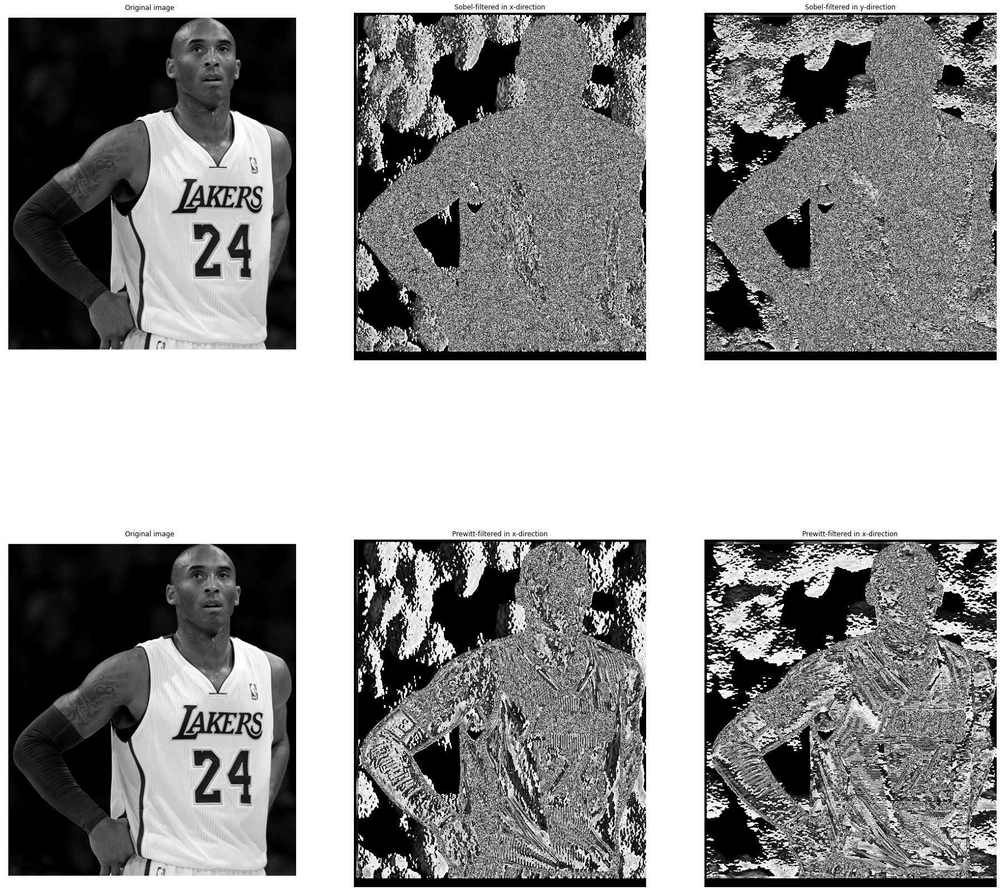

In [66]:
f5_1 = filter_general(img,sobel5_x)
f5_2 = filter_general(img,sobel5_y)
f5_3 = filter_general(img,prewitt5_x)
f5_4 = filter_general(img,prewitt5_y)

cv2.imwrite('output_data/Q2/Q2_4/kobe_5x5_sobel_x.jpg',f5_1)
cv2.imwrite('output_data/Q2/Q2_4/kobe_5x5_sobel_y.jpg',f5_2)
cv2.imwrite('output_data/Q2/Q2_4/kobe_5x5_prewitt_x.jpg',f5_3)
cv2.imwrite('output_data/Q2/Q2_4/kobe_5x5_prewitt_y.jpg',f5_4)

fig = plt.figure(figsize=(32,32))

ax21 = fig.add_subplot(2,3,1)
ax21.imshow(img,cmap="gray")
ax21.axis('off')
ax21.set_title("Original image")

ax22 = fig.add_subplot(2,3,2)
ax22.imshow(f5_1,cmap="gray")
ax22.axis('off')
ax22.set_title("Sobel-filtered in x-direction")

ax23 = fig.add_subplot(2,3,3)
ax23.imshow(f5_2,cmap="gray")
ax23.axis('off')
ax23.set_title("Sobel-filtered in y-direction")

ax31 = fig.add_subplot(2,3,4)
ax31.imshow(img,cmap="gray")
ax31.axis('off')
ax31.set_title("Original image")

ax32 = fig.add_subplot(2,3,5)
ax32.imshow(f5_3,cmap="gray")
ax32.axis('off')
ax32.set_title("Prewitt-filtered in x-direction")

ax33 = fig.add_subplot(2,3,6)
ax33.imshow(f5_4,cmap="gray")
ax33.axis('off')
ax33.set_title("Prewitt-filtered in x-direction")

Text(0.5, 1.0, 'Original image')

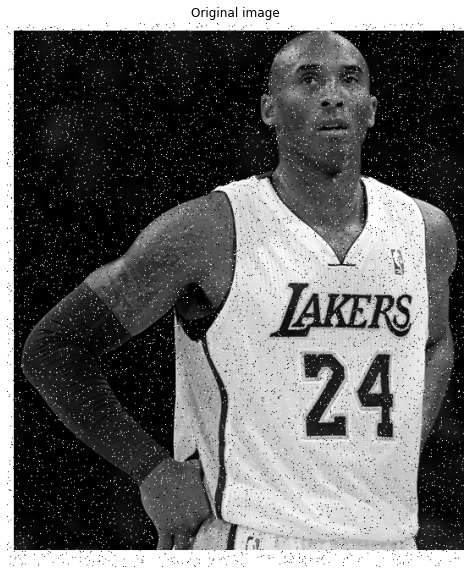

In [67]:
shp = img.shape
m = 32

import random

def sp_noise(img,p):
    '''
    Add salt and pepper noise to image
    prob: Probability of the noise
    '''
    img_o = np.zeros(img.shape,np.uint8)
    th = 1 - p 
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            rdn = random.random()
            if rdn < p:
                img_o[i][j] = 0
            elif rdn > th:
                img_o[i][j] = 255
            else:
                img_o[i][j] = img[i][j]
    return img_o

noisy = sp_noise(img,0.02)
fig = plt.figure(figsize=(10,10))

cv2.imwrite('output_data/Q2/Q2_5/kobe_noisy.jpg',noisy)

ax = fig.add_subplot(1,1,1)
ax.imshow(noisy,cmap="gray")
ax.axis('off')
ax.set_title("Original image")

In [68]:
f1 = filter_general(noisy,roberts_x)
f2 = filter_general(noisy,roberts_y)
f3 = filter_general(noisy,sobel_x)
f4 = filter_general(noisy,sobel_y)
f5 = filter_general(noisy,prewitt_x)
f6 = filter_general(noisy,prewitt_y)
f7 = filter_general(noisy,laplace1)
f8 = filter_general(noisy,laplace2)

cv2.imwrite('output_data/Q2/Q2_5/kobe_noisy_roberts_x.jpg',f1)
cv2.imwrite('output_data/Q2/Q2_5/kobe_noisy_roberts_y.jpg',f2)
cv2.imwrite('output_data/Q2/Q2_5/kobe_noisy_sobel_x.jpg',f3)
cv2.imwrite('output_data/Q2/Q2_5/kobe_noisy_sobel_y.jpg',f4)
cv2.imwrite('output_data/Q2/Q2_5/kobe_noisy_prewitt_x.jpg',f5)
cv2.imwrite('output_data/Q2/Q2_5/kobe_noisy_prewitt_y.jpg',f6)
cv2.imwrite('output_data/Q2/Q2_5/kobe_noisy_laplace_1.jpg',f7)
cv2.imwrite('output_data/Q2/Q2_5/kobe_noisy_laplace_2.jpg',f8)

f12 = np.floor(np.sqrt(f1**2 + f2**2)).astype('uint8')
f34 = np.floor(np.sqrt(f3**2 + f4**2)).astype('uint8')
f56 = np.floor(np.sqrt(f5**2 + f6**2)).astype('uint8')
f78 = np.floor(np.sqrt(f7**2 + f8**2)).astype('uint8')
cv2.imwrite('output_data/Q2/Q2_5/kobe_noisy_sqrt1.jpg',f12)
cv2.imwrite('output_data/Q2/Q2_5/kobe_noisy_sqrt2.jpg',f34)
cv2.imwrite('output_data/Q2/Q2_5/kobe_noisy_sqrt3.jpg',f56)
cv2.imwrite('output_data/Q2/Q2_5/kobe_noisy_sqrt4.jpg',f78)

f9 = cv2.Canny(noisy,100,200)
cv2.imwrite('output_data/Q2/Q2_5/kobe_noisy_canny.jpg',f9)

True

Text(0.5, 1.0, 'Canny edge filter:T1=100,T2=200')

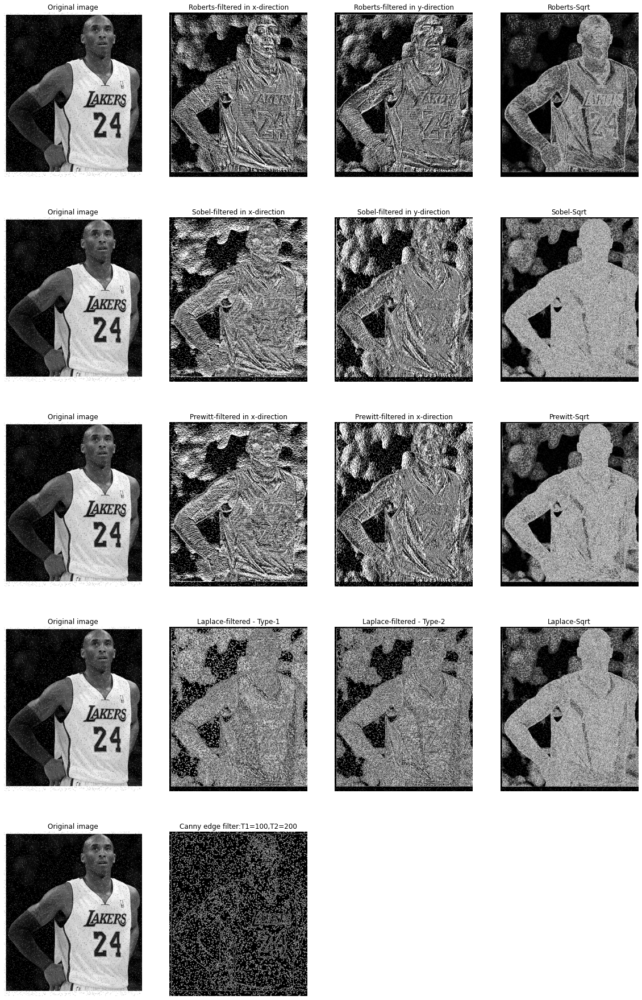

In [69]:
fig = plt.figure(figsize=(20,32))

ax11 = fig.add_subplot(5,4,1)
ax11.imshow(noisy,cmap="gray")
ax11.axis('off')
ax11.set_title("Original image")

ax12 = fig.add_subplot(5,4,2)
ax12.imshow(f1,cmap="gray")
ax12.axis('off')
ax12.set_title("Roberts-filtered in x-direction")

ax13 = fig.add_subplot(5,4,3)
ax13.imshow(f2,cmap="gray")
ax13.axis('off')
ax13.set_title("Roberts-filtered in y-direction")

ax14 = fig.add_subplot(5,4,4)
ax14.imshow(f12,cmap="gray")
ax14.axis('off')
ax14.set_title("Roberts-Sqrt")

ax21 = fig.add_subplot(5,4,5)
ax21.imshow(noisy,cmap="gray")
ax21.axis('off')
ax21.set_title("Original image")

ax22 = fig.add_subplot(5,4,6)
ax22.imshow(f3,cmap="gray")
ax22.axis('off')
ax22.set_title("Sobel-filtered in x-direction")

ax23 = fig.add_subplot(5,4,7)
ax23.imshow(f4,cmap="gray")
ax23.axis('off')
ax23.set_title("Sobel-filtered in y-direction")

ax24 = fig.add_subplot(5,4,8)
ax24.imshow(f34,cmap="gray")
ax24.axis('off')
ax24.set_title("Sobel-Sqrt")

ax31 = fig.add_subplot(5,4,9)
ax31.imshow(noisy,cmap="gray")
ax31.axis('off')
ax31.set_title("Original image")

ax32 = fig.add_subplot(5,4,10)
ax32.imshow(f5,cmap="gray")
ax32.axis('off')
ax32.set_title("Prewitt-filtered in x-direction")

ax33 = fig.add_subplot(5,4,11)
ax33.imshow(f6,cmap="gray")
ax33.axis('off')
ax33.set_title("Prewitt-filtered in x-direction")

ax34 = fig.add_subplot(5,4,12)
ax34.imshow(f56,cmap="gray")
ax34.axis('off')
ax34.set_title("Prewitt-Sqrt")

ax41 = fig.add_subplot(5,4,13)
ax41.imshow(noisy,cmap="gray")
ax41.axis('off')
ax41.set_title("Original image")

ax42 = fig.add_subplot(5,4,14)
ax42.imshow(f7,cmap="gray")
ax42.axis('off')
ax42.set_title("Laplace-filtered - Type-1")

ax43 = fig.add_subplot(5,4,15)
ax43.imshow(f8,cmap="gray")
ax43.axis('off')
ax43.set_title("Laplace-filtered - Type-2")

ax44 = fig.add_subplot(5,4,16)
ax44.imshow(f78,cmap="gray")
ax44.axis('off')
ax44.set_title("Laplace-Sqrt")

ax51 = fig.add_subplot(5,4,17)
ax51.imshow(noisy,cmap="gray")
ax51.axis('off')
ax51.set_title("Original image")

ax52 = fig.add_subplot(5,4,18)
ax52.imshow(f9,cmap="gray")
ax52.axis('off')
ax52.set_title("Canny edge filter:T1=100,T2=200")